# Real Data Time Series Forecasting: Model 2 (Bayesian)

## Import Libraries

In [ ]:
import importlib
import utils_model2

importlib.reload(utils_model2)
from utils_model2 import *

In [ ]:
device = cuda_check(verbose=1)

In [ ]:
metadata = pd.read_csv('DeDe_48stations/DeDe_48sites_metadata.csv')

metadata

## Import Dataset

In [5]:
# Load the dataset
df = pd.read_csv('DeDe_48stations_allfeatures/GHI_CI_NCEP_Iclr_15min_DeDe2023_newiclr.csv', index_col='Datetime', parse_dates=True)

# Drop columns
df = df.drop(columns=['CI_CM', 'CI_RGB', 'Wind direction', 'Snowfall', 'Snow depth'])
df = df.rename(columns={
    'Relative Humidity': 'RelativeHumidity', 
    'Wind speed': 'WindSpeed',
    'Short-wave irradiation': 'Inwp',
    })

df

,Site_id,rawI,I,CI_CM_interpolated,CI_RGB_interpolated,Temperature,RelativeHumidity,Pressure,WindSpeed,Rainfall,Inwp,Iclr
Datetime,,,,,,,,,,,,
2023-01-01 00:00:00,1,-2.596000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2023-01-01 00:00:00,3,-2.651000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2023-01-01 00:00:00,4,-2.212500,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2023-01-01 00:00:00,5,-2.671000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2023-01-01 00:00:00,6,-3.543833,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 23:45:00,44,-2.196333,0.0,NaN,NaN,301.65,63.49,1008.03,0.29,0.0,0.0,0.0
2023-12-31 23:45:00,45,-2.238667,0.0,NaN,NaN,296.91,64.69,1002.19,1.96,0.0,0.0,0.0
2023-12-31 23:45:00,46,-2.570167,0.0,NaN,NaN,291.68,65.54,964.87,0.76,0.0,0.0,0.0


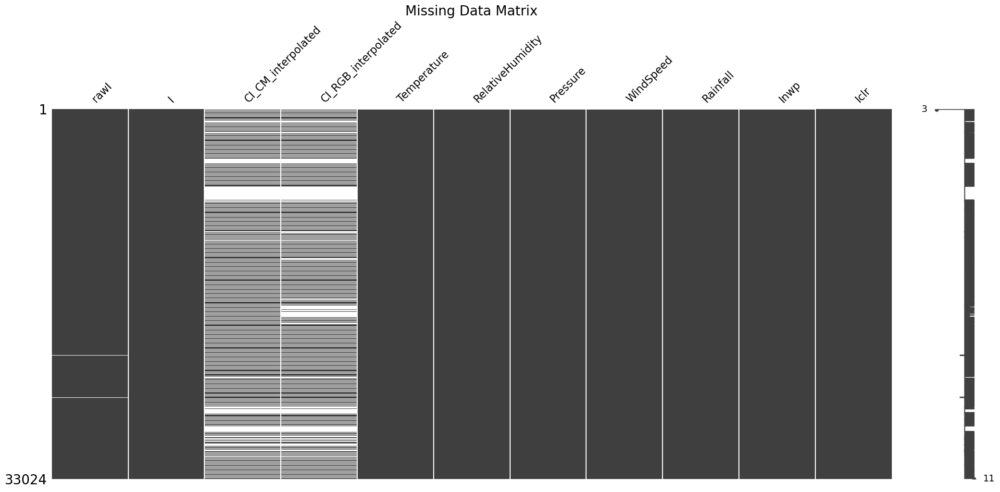

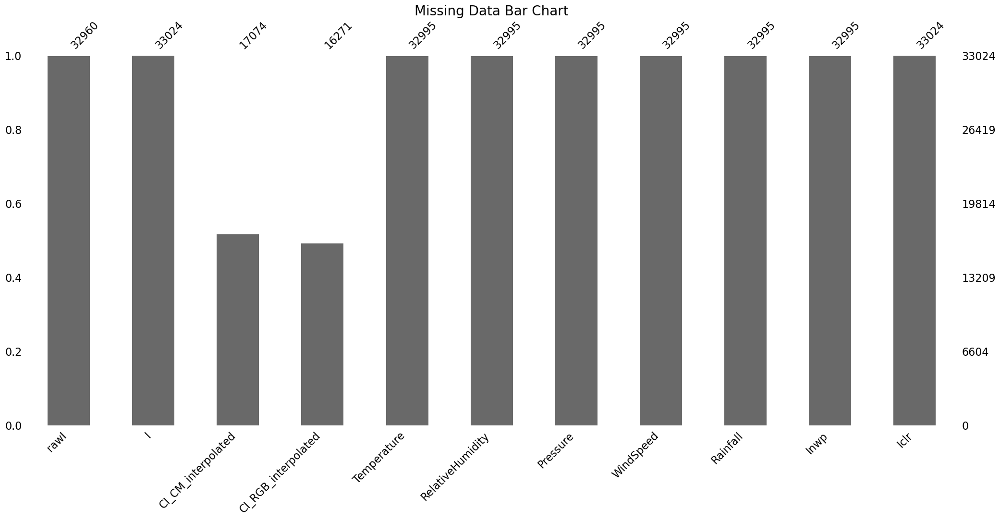

In [6]:
df_site1 = df[df['Site_id'] == 1].drop(columns = 'Site_id')

#----- Visualizing Missing Values in DataFrame -----
# Visualize missing data matrix
msno.matrix(df_site1)
plt.title("Missing Data Matrix", fontsize = 20)
plt.show()

''' 
The rightmost line is a sparkline that summarizes the completeness of data in each rows. 
- number '0' means 'there are 0 column that have no missing values in all rows'
- number '10' means 'there are at most 10 columns that have no missing values in the same row'
'''

# Visualize missing data bar chart
msno.bar(df_site1)
plt.title("Missing Data Bar Chart", fontsize = 20)
plt.show()

There are 2 types of missing data (gap):
1. Small gaps: less than 12 hours, we will use 'Linear Interpolation' to fill in the missing values in each column.
2. Large gaps: more than or equal 12 hours, we will leave them as NaN values.

In [7]:
# Create a full date range
starting_date = min(df_site1.index)
ending_date = max(df_site1.index)
resolution = df_site1.index[1] - df_site1.index[0]

full_date_range = pd.date_range(start=starting_date, end=ending_date, freq=resolution)

# Make index of df_site1 have consistent resolution (where the missing data are filled with NaN to be imputed later)
df_site1 = df_site1.reindex(full_date_range)

# Add Hour index into  the dataframe
df_site1['Hour'] = np.sin(df_site1.index.hour / 24  * np.pi)

df_site1 = df_site1.drop(columns=['CI_CM_interpolated', 'CI_RGB_interpolated', 'rawI'])

# Drop nan rows
df_site1 = df_site1['2023-01-01 07:15:00':]

# Physically, irradiance should not exceed $1200 \text{ W/m}^2$ 
# since it is the solar irradiance that is measured from atmosphere. 
# We can see that there are some values that exceed this limit.
# We will set (or so called 'clip') these values to $1200 \text{ W/m}^2$.

df_site1.loc[:, 'I'] = df_site1['I'].clip(upper=1200)
df_site1.loc[:, 'Inwp'] = df_site1['Inwp'].clip(upper=1200)
df_site1.loc[:, 'Iclr'] = df_site1['Iclr'].clip(upper=1200)

# df_site1['CI_RGB_interpolated'] = df_site1['CI_RGB_interpolated']  / 255
# in the column 'Temperature', the outlier occurs in 2023-01-30 between 04:00 and 10:00.

df_site1.loc['2023-01-30 04:00': '2023-01-30 10:00', 'Temperature'] = np.nan

#  Create a NaN mask
cols = ['I', 'Temperature', 'RelativeHumidity', 'Pressure', 'WindSpeed', 'Rainfall', 'Inwp', 'Iclr']

for col in cols:
    nan_mask = df_site1[col].isna()
    
    # Identify consecutive NaN groups
    group_id = (nan_mask != nan_mask.shift()).cumsum(axis=0)  # Unique ID for each block per column

    # Prepare empty DataFrame to store group sizes per column
    group_sizes = nan_mask.groupby(group_id).transform('sum')

    # Build interpolation mask: interpolate only gaps 
    interpolation_mask = nan_mask & (group_sizes < 48)  # 48 time steps = 48 * 15 minutes = 12 hours

    # Temporarily mask large gaps
    temp_df = df_site1[col].copy()

    # Perform linear time-based interpolation for all columns
    interpolated_df = temp_df.interpolate(method='time', axis=0).where(interpolation_mask)

    # Assign interpolated results back to the original dataframe
    df_site1[col] = df_site1[col].fillna(interpolated_df)

rows_with_nans = df_site1.isna().any(axis=1)
df_site1.loc[rows_with_nans] = np.nan

df_site1

,I,Temperature,RelativeHumidity,Pressure,WindSpeed,Rainfall,Inwp,Iclr,Hour
2023-01-01 07:15:00,73.329167,294.21,60.44,1015.55,1.32,0.0,49.2072,29.613384,0.793353
2023-01-01 07:30:00,121.397833,294.58,59.34,1015.67,1.42,0.0,89.4216,70.667648,0.793353
2023-01-01 07:45:00,180.090333,294.94,58.24,1015.80,1.52,0.0,135.4960,119.863447,0.793353
2023-01-01 08:00:00,219.603167,295.30,57.14,1015.93,1.63,0.0,187.0808,172.749977,0.866025
2023-01-01 08:15:00,281.884500,295.67,56.04,1016.06,1.74,0.0,243.7740,226.928713,0.866025
...,...,...,...,...,...,...,...,...,...
2023-12-31 22:45:00,0.000000,301.79,49.05,1011.08,2.31,0.0,0.0000,0.000000,0.258819
2023-12-31 23:00:00,0.000000,301.68,49.35,1011.07,2.32,0.0,0.0000,0.000000,0.130526
2023-12-31 23:15:00,0.000000,301.56,49.66,1011.04,2.32,0.0,0.0000,0.000000,0.130526
2023-12-31 23:30:00,0.000000,301.44,49.96,1011.03,2.33,0.0,0.0000,0.000000,0.130526


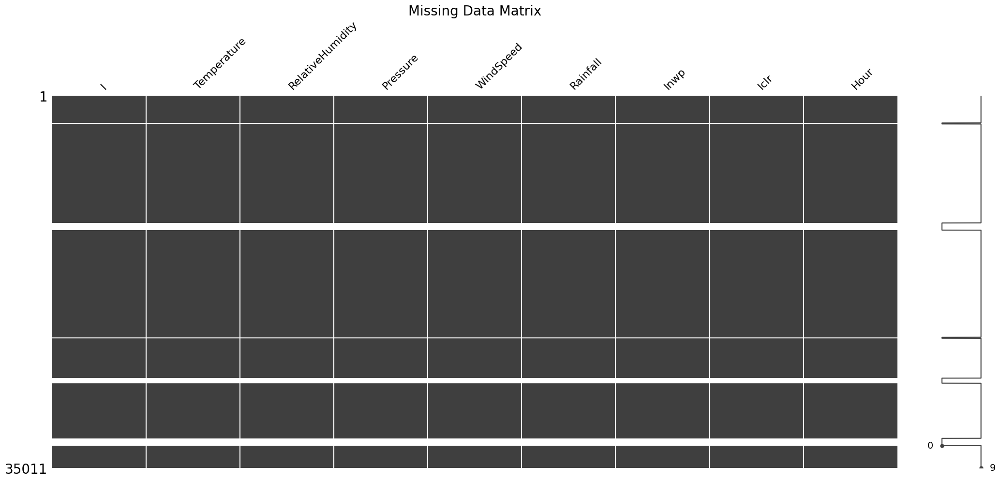

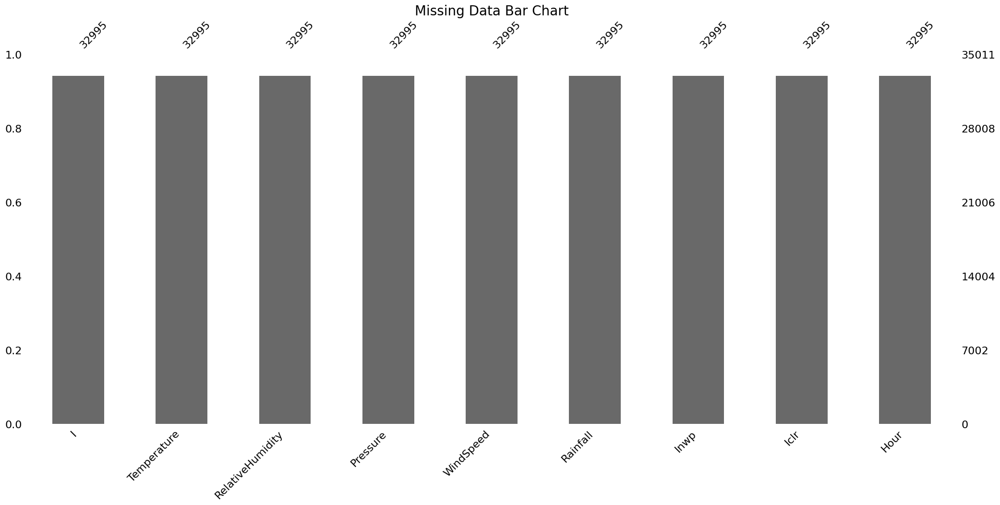

In [8]:
#----- Visualizing Missing Values in DataFrame -----

import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt

# Visualize missing data matrix
msno.matrix(df_site1)
plt.title("Missing Data Matrix", fontsize = 20)
plt.show()

''' 
The rightmost line is a sparkline that summarizes the completeness of data in each rows. 
- number '0' means 'there are 0 column that have no missing values in all rows'
- number '10' means 'there are at most 10 columns that have no missing values in the same row'
'''

# Visualize missing data bar chart
msno.bar(df_site1)
plt.title("Missing Data Bar Chart", fontsize = 20)
plt.show()

In [9]:
# Visualize the dataset (at site 1)

columns = ['I', 'Inwp', 'Iclr']
columns_name_text = ['I', 'I_nwp', 'I_clr']

# Visualize the result
fig = go.Figure()

# Add the 'Actual' trace

for i in range(len(columns)):
    fig.add_trace(go.Scatter(x=df_site1.index, y=df_site1[columns[i]],
                         mode='lines',
                         name=columns_name_text[i],
                         line=dict(width=1)))

# Update layout for title, axis labels, and grid
fig.update_layout(
    title='Time Series Plot',
    xaxis_title='DateTime',
    yaxis_title='Irradiance',
    hovermode='x unified', # This is useful for time series to see values across traces at a given x
    template='plotly_white' # A clean white background template
)

# Add gridlines
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgray')

fig.show()

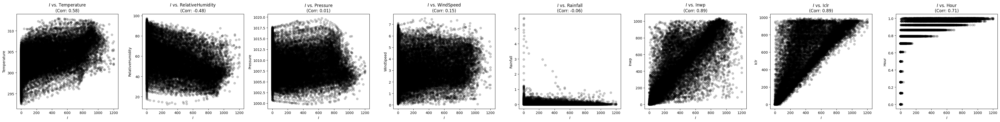

In [10]:
# Calculate the correlation matrix for all columns
correlation_matrix = df_site1.corr(method='pearson')

# Get the columns to plot against 'I', excluding 'I' itself
columns_to_plot = df_site1.drop(columns=['I']).columns

# Create subplots dynamically
# The number of subplots is equal to the number of columns to plot against 'I'
fig, ax = plt.subplots(1, len(columns_to_plot), figsize=(5 * len(columns_to_plot), 5))

# If there's only one column to plot, ax will not be an array, so handle that case
if len(columns_to_plot) == 1:
    ax = [ax] # Make it a list so the loop works consistently

for i, col in enumerate(columns_to_plot):
    # Calculate the Pearson correlation coefficient between 'I' and the current column
    # We use .loc to ensure we get the specific correlation value
    correlation = correlation_matrix.loc['I', col]

    # Create the scatter plot
    ax[i].scatter(df_site1['I'], df_site1[col], c='black', alpha=0.2)
    
    # Set labels
    ax[i].set_xlabel('$I$')
    ax[i].set_ylabel(f'{col}')
    
    # Set title including the correlation value
    # Using f-string for easy formatting, rounding correlation to 2 decimal places
    ax[i].set_title(f'$I$ vs. {col}\n(Corr: {correlation:.2f})')

plt.tight_layout() # Adjusts subplot parameters for a tight layout
plt.show()

### Make an input and output data

In [11]:
df_site1

,I,Temperature,RelativeHumidity,Pressure,WindSpeed,Rainfall,Inwp,Iclr,Hour
2023-01-01 07:15:00,73.329167,294.21,60.44,1015.55,1.32,0.0,49.2072,29.613384,0.793353
2023-01-01 07:30:00,121.397833,294.58,59.34,1015.67,1.42,0.0,89.4216,70.667648,0.793353
2023-01-01 07:45:00,180.090333,294.94,58.24,1015.80,1.52,0.0,135.4960,119.863447,0.793353
2023-01-01 08:00:00,219.603167,295.30,57.14,1015.93,1.63,0.0,187.0808,172.749977,0.866025
2023-01-01 08:15:00,281.884500,295.67,56.04,1016.06,1.74,0.0,243.7740,226.928713,0.866025
...,...,...,...,...,...,...,...,...,...
2023-12-31 22:45:00,0.000000,301.79,49.05,1011.08,2.31,0.0,0.0000,0.000000,0.258819
2023-12-31 23:00:00,0.000000,301.68,49.35,1011.07,2.32,0.0,0.0000,0.000000,0.130526
2023-12-31 23:15:00,0.000000,301.56,49.66,1011.04,2.32,0.0,0.0000,0.000000,0.130526
2023-12-31 23:30:00,0.000000,301.44,49.96,1011.03,2.33,0.0,0.0000,0.000000,0.130526


In [8]:
# Make Input Sequences
lookback = pd.Timedelta('1d')
lookforward = pd.Timedelta('4d')

lag_regressor_cols = ['I']
exogenous_col_list = ['Temperature', 'RelativeHumidity', 'Pressure', 'WindSpeed', 'Rainfall', 'Inwp', 'Iclr', 'Hour']
train_ratio=0.8
val_ratio=0.1

# Convert from the input timedelta into time step
time_step_duration = df_site1.index[1] - df_site1.index[0] 
lookback_timestep = lookback // time_step_duration
lookforward_timestep = lookforward // time_step_duration

# Lag regressor inputs
x_lag, datetime = df_transform_lag_regressor(df = df_site1, lag_regressor_cols=lag_regressor_cols, lookback_timestep=lookback_timestep)
x_lag_scaled, x_lag_scalers = scale_transform_single_var(x_lag)
x_lag_mask = ~np.isnan(x_lag).any(axis=(1, 2))

# Exogenous inputs
x_exo = df_site1[exogenous_col_list].to_numpy()
x_exo_scaled, x_exo_scaler = scale_transform_single_var(x_exo)
x_exo_mask = ~np.isnan(x_exo).any(axis=1)

# Target
y, datetime = df_transform_target(df=df_site1, target_col='I', lookforward_timestep=lookforward_timestep)
y_scaled, y_numpy_scalers = scale_transform_single_var(y)
y_mask = ~np.isnan(y).any(axis=1)

# All mask: filter out samples containing nan
all_mask = x_lag_mask & x_exo_mask & y_mask 
datetime = datetime[all_mask]

x_lag_scaled = x_lag_scaled[all_mask, :, :]
x_exo_scaled = x_exo_scaled[all_mask, :]
y_scaled = y_scaled[all_mask, :]

# Convert into torch.tensor
x_lag_scaled = torch.tensor(x_lag_scaled, dtype=torch.float32).to(device)
x_exo_scaled = torch.tensor(x_exo_scaled, dtype=torch.float32).to(device)
y_scaled = torch.tensor(y_scaled, dtype=torch.float32).to(device)

# Train-val-test split
(x_lag_scaled_train, x_exo_scaled_train, y_scaled_train), \
(x_lag_scaled_val, x_exo_scaled_val, y_scaled_val), \
(x_lag_scaled_test, x_exo_scaled_test, y_scaled_test), \
(datetime_train, datetime_val, datetime_test) = split_time_series_multi_feature(x_lag=x_lag_scaled, x_exo=x_exo_scaled, y=y_scaled, datetime=datetime, train_ratio=train_ratio, val_ratio=val_ratio)

# Make a dataloader for train dataset 
train_dataset = TensorDataset(x_lag_scaled_train, x_exo_scaled_train, y_scaled_train)
val_dataset = TensorDataset(x_lag_scaled_val, x_exo_scaled_val, y_scaled_val)
test_dataset = TensorDataset(x_lag_scaled_test, x_exo_scaled_test, y_scaled_test)

train_dataloader = DataLoader(train_dataset, batch_size = 32, shuffle = False)
val_dataloader = DataLoader(val_dataset, batch_size = 32, shuffle = False)
test_dataloader = DataLoader(test_dataset, batch_size = 32, shuffle = False)


--- Data Split Summary ---
Total samples:      30121
Train samples:      24096   (X_lag shape: torch.Size([24096, 96, 1]), X_exo shape: torch.Size([24096, 8]), Y shape: torch.Size([24096, 384]))
Validation samples: 3012     (X_lag shape: torch.Size([3012, 96, 1]), X_exo shape: torch.Size([3012, 8]), Y shape: torch.Size([3012, 384]))
Test samples:       3013    (X_lag shape: torch.Size([3013, 96, 1]), X_exo shape: torch.Size([3013, 8]), Y shape: torch.Size([3013, 384]))
--------------------------


In [11]:
x_lag.shape, x_exo.shape, y.shape

((35011, 96, 1), (35011, 8), (35011, 384))

## Experiment

#### Initial

In [58]:
torch.manual_seed(42)
model_init = HybridNetModel(
    x_lag_input_size = x_lag_scaled.shape[2],
    x_exo_input_size = x_exo_scaled.shape[1],
    output_size = y_scaled.shape[1], 
    seq_len = lookback_timestep, 
    d_model = 16, 
    nhead = 4, 
    dim_feedforward = 64,
    dropout = 0.1
).to(device)
optimizer = Adam(model_init.parameters(), lr=0.001)
criterion = nn.L1Loss()

print("\n--- Model ---")
print("Model architecture:")
print(model_init)
print(f"Total parameters: {sum(p.numel() for p in model_init.parameters() if p.requires_grad)}")


--- Model ---
Model architecture:
HybridNetModel(
  (input_embedding): Linear(in_features=1, out_features=16, bias=True)
  (positional_encoding): PositionalEncoding(
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (transformer_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-1): 2 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=16, out_features=16, bias=True)
        )
        (linear1): Linear(in_features=16, out_features=64, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=64, out_features=16, bias=True)
        (norm1): LayerNorm((16,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((16,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.1, inplace=False)
        (dropout2): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (regression_head): Sequential(
    (0): Linear(in_features=1544, out_feat

In [63]:
##### Train the Model #####

# Clear CUDA cache before starting hyperparameter search
if torch.cuda.is_available():
    torch.cuda.empty_cache()

model_init, *loss_history_model = trainer_multi_feature(
    model_init, 
    train_dataloader=train_dataloader, 
    val_dataloader=val_dataloader,
    optimizer=optimizer, 
    criterion=criterion, 
    scheduler=None, 
    max_epochs=200, 
    early_stopping_patience=5,
    )


--- Training ---
Training started...
Epoch 001 | Train Loss: 0.3160 | Val Loss: 0.2317 | Reset early stopping count + Keep the best model
Epoch 002 | Train Loss: 0.2543 | Val Loss: 0.2267 | Reset early stopping count + Keep the best model
Epoch 003 | Train Loss: 0.2384 | Val Loss: 0.2243 | Reset early stopping count + Keep the best model
Epoch 004 | Train Loss: 0.2288 | Val Loss: 0.2150 | Reset early stopping count + Keep the best model
Epoch 005 | Train Loss: 0.2233 | Val Loss: 0.2197 | 


KeyboardInterrupt: 

In [ ]:
##### Make a Prediction to the whole Dataset #####

y_pred, y_test, eval_loss = predictor_multi_feature(
    model=model_init, 
    test_dataloader=test_dataloader,
    y_scaler=y_numpy_scalers[0],
    criterion=nn.L1Loss(), 
    )

print(f'Evaluation Loss: {eval_loss}')

plotly_visualization_line(x=datetime_test, y=[y_test[:, 0], y_pred[:, 0]], name=['Actual', 'Predicted'])

Evaluation Loss: 0.16358900898434584


In [59]:
##### Make a Prediction to the whole Dataset #####

y_train_pred, y_train, eval_loss = predictor_multi_feature(
    model=model_init, 
    test_dataloader=val_dataloader,
    y_scaler=y_numpy_scalers[0],
    criterion=nn.L1Loss(), 
    )

print(f'Evaluation Loss: {eval_loss}')

plotly_visualization_line(x=datetime_train, y=[y_train[:, 0], y_train_pred[:, 0]], name=['Actual', 'Predicted'])

Evaluation Loss: 0.7189174870065614


### Bayesian Hyper-parameter Optimization

In [ ]:
def objective_bayesian(trial, model_parameters, train_dataloader, val_dataloader, device=cuda_check()):
    if torch.cuda.is_available():
        gc.collect()
        torch.cuda.empty_cache()

    try:
        d_model_per_head = trial.suggest_categorical('d_model_per_head', [4, 8, 16, 32, 64])
        nhead = trial.suggest_categorical('nhead', [1, 2, 4, 8])
        num_layers = trial.suggest_int('num_layers', 1, 4)
        dim_feedforward = trial.suggest_categorical('dim_feedforward', [32, 64, 128, 256])

        torch.manual_seed(42)
        model = HybridNetModel(
            x_lag_input_size = model_parameters['x_lag_input_size'],
            x_exo_input_size = model_parameters['x_exo_input_size'],
            output_size = model_parameters['output_size'], 
            seq_len = model_parameters['seq_len'], 
            d_model = d_model_per_head * nhead, 
            nhead = nhead, 
            num_layers = num_layers, 
            dim_feedforward = dim_feedforward,
            dropout = 0.1
        ).to(device)

        optimizer = Adam(model.parameters(), lr=0.001)
        criterion = nn.L1Loss()
        # scheduler = ExponentialLR(optimizer, gamma=0.99)

        _, _, val_loss = trainer_multi_feature(
            model=model,
            optimizer=optimizer,
            criterion=criterion,
            train_dataloader=train_dataloader,
            val_dataloader=val_dataloader,
            scheduler=None,
            max_epochs=50,
            early_stopping_patience=20,
            display_result=False
        )

        return val_loss[-1] if val_loss else float('inf')

    except Exception as e:
        print(f"Trial failed: {e}")
        return float('inf')

In [ ]:
# Bayesian Optimization
n_trials = 60

model_parameters = {
    'x_lag_input_size': x_lag_scaled.shape[2],
    'x_exo_input_size': x_exo_scaled.shape[1],
    'output_size': y_scaled.shape[1], 
    'seq_len': lookback_timestep, 
}

objective = lambda trial: objective_bayesian(
        trial, 
        model_parameters, 
        train_dataloader, 
        val_dataloader
    )
 

study = run_optimization(
    objective = objective, 
    n_trials = n_trials, 
    timeout = None, 
    sampler = optuna.samplers.TPESampler(seed=42), 
    pruner = optuna.pruners.MedianPruner(
        n_startup_trials=5,     # First 5 trials will run fully without begin pruned
        n_warmup_steps=3,       # No pruning in the first 3 steps of any trial
        interval_steps=1,       # Pruning check every 2 epochs
        n_min_trials=5          # Need at least 3 completed trials before pruning starts
        ),
    n_jobs = 1,
    )

[I 2025-07-22 17:16:52,196] A new study created in memory with name: no-name-e6ac8f40-2ba8-4780-8dd9-a6c9b6b487ed
Best trial: 0. Best value: 0.200524:   2%|▏         | 1/60 [03:08<3:05:33, 188.71s/it]

[I 2025-07-22 17:20:00,900] Trial 0 finished with value: 0.20052350735218794 and parameters: {'d_model_per_head': 8, 'nhead': 4, 'num_layers': 3, 'dim_feedforward': 64}. Best is trial 0 with value: 0.20052350735218794.


Best trial: 0. Best value: 0.200524:   3%|▎         | 2/60 [06:03<2:54:19, 180.33s/it]

[I 2025-07-22 17:22:55,375] Trial 1 finished with value: 0.20409244149192876 and parameters: {'d_model_per_head': 32, 'nhead': 2, 'num_layers': 2, 'dim_feedforward': 64}. Best is trial 0 with value: 0.20052350735218794.


Best trial: 2. Best value: 0.198965:   5%|▌         | 3/60 [09:07<2:52:51, 181.95s/it]

[I 2025-07-22 17:25:59,253] Trial 2 finished with value: 0.1989650802741594 and parameters: {'d_model_per_head': 16, 'nhead': 2, 'num_layers': 1, 'dim_feedforward': 32}. Best is trial 2 with value: 0.1989650802741594.


Best trial: 2. Best value: 0.198965:   7%|▋         | 4/60 [14:13<3:35:47, 231.21s/it]

[I 2025-07-22 17:31:05,973] Trial 3 finished with value: 0.2029601619578898 and parameters: {'d_model_per_head': 8, 'nhead': 8, 'num_layers': 4, 'dim_feedforward': 32}. Best is trial 2 with value: 0.1989650802741594.


Best trial: 2. Best value: 0.198965:   8%|▊         | 5/60 [19:01<3:50:46, 251.76s/it]

[I 2025-07-22 17:35:54,178] Trial 4 finished with value: 0.2573050721457191 and parameters: {'d_model_per_head': 64, 'nhead': 2, 'num_layers': 3, 'dim_feedforward': 256}. Best is trial 2 with value: 0.1989650802741594.


Best trial: 5. Best value: 0.196864:  10%|█         | 6/60 [22:33<3:34:12, 238.01s/it]

[I 2025-07-22 17:39:25,488] Trial 5 finished with value: 0.19686402065460296 and parameters: {'d_model_per_head': 32, 'nhead': 2, 'num_layers': 1, 'dim_feedforward': 32}. Best is trial 5 with value: 0.19686402065460296.


Best trial: 5. Best value: 0.196864:  12%|█▏        | 7/60 [41:31<7:50:09, 532.26s/it]

[I 2025-07-22 17:58:23,570] Trial 6 finished with value: 0.25529202312121496 and parameters: {'d_model_per_head': 64, 'nhead': 8, 'num_layers': 3, 'dim_feedforward': 32}. Best is trial 5 with value: 0.19686402065460296.


Best trial: 5. Best value: 0.196864:  13%|█▎        | 8/60 [45:13<6:15:35, 433.38s/it]

[I 2025-07-22 18:02:05,212] Trial 7 finished with value: 0.20150788676212816 and parameters: {'d_model_per_head': 32, 'nhead': 2, 'num_layers': 4, 'dim_feedforward': 128}. Best is trial 5 with value: 0.19686402065460296.


Best trial: 5. Best value: 0.196864:  15%|█▌        | 9/60 [48:07<4:59:35, 352.46s/it]

[I 2025-07-22 18:04:59,744] Trial 8 finished with value: 0.2067618945650026 and parameters: {'d_model_per_head': 4, 'nhead': 2, 'num_layers': 4, 'dim_feedforward': 256}. Best is trial 5 with value: 0.19686402065460296.


Best trial: 5. Best value: 0.196864:  17%|█▋        | 10/60 [50:52<4:05:34, 294.70s/it]

[I 2025-07-22 18:07:45,106] Trial 9 finished with value: 0.20233783470101507 and parameters: {'d_model_per_head': 8, 'nhead': 8, 'num_layers': 2, 'dim_feedforward': 256}. Best is trial 5 with value: 0.19686402065460296.


Best trial: 10. Best value: 0.195192:  18%|█▊        | 11/60 [52:35<3:12:43, 235.99s/it]

[I 2025-07-22 18:09:27,972] Trial 10 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  20%|██        | 12/60 [54:22<2:37:19, 196.65s/it]

[I 2025-07-22 18:11:14,654] Trial 11 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  22%|██▏       | 13/60 [56:01<2:10:59, 167.23s/it]

[I 2025-07-22 18:12:54,169] Trial 12 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  23%|██▎       | 14/60 [58:25<2:02:45, 160.11s/it]

[I 2025-07-22 18:15:17,835] Trial 13 finished with value: 0.20318637056020544 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 2, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  25%|██▌       | 15/60 [1:00:05<1:46:28, 141.97s/it]

[I 2025-07-22 18:16:57,761] Trial 14 finished with value: 0.22473461211969456 and parameters: {'d_model_per_head': 4, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  27%|██▋       | 16/60 [1:02:20<1:42:28, 139.75s/it]

[I 2025-07-22 18:19:12,347] Trial 15 finished with value: 0.198006009847364 and parameters: {'d_model_per_head': 16, 'nhead': 1, 'num_layers': 2, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  28%|██▊       | 17/60 [1:04:02<1:32:04, 128.47s/it]

[I 2025-07-22 18:20:54,608] Trial 16 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  30%|███       | 18/60 [1:06:06<1:29:04, 127.25s/it]

[I 2025-07-22 18:22:58,996] Trial 17 finished with value: 0.20371359563889166 and parameters: {'d_model_per_head': 32, 'nhead': 4, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  32%|███▏      | 19/60 [1:08:27<1:29:45, 131.35s/it]

[I 2025-07-22 18:25:19,914] Trial 18 finished with value: 0.20318637056020544 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 2, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  33%|███▎      | 20/60 [1:10:35<1:26:53, 130.34s/it]

[I 2025-07-22 18:27:27,894] Trial 19 finished with value: 0.2195826463364795 and parameters: {'d_model_per_head': 4, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 64}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  35%|███▌      | 21/60 [1:13:11<1:29:46, 138.12s/it]

[I 2025-07-22 18:30:04,167] Trial 20 finished with value: 0.1982057747321532 and parameters: {'d_model_per_head': 64, 'nhead': 1, 'num_layers': 2, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  37%|███▋      | 22/60 [1:15:02<1:22:13, 129.84s/it]

[I 2025-07-22 18:31:54,684] Trial 21 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  38%|███▊      | 23/60 [1:17:00<1:17:52, 126.28s/it]

[I 2025-07-22 18:33:52,656] Trial 22 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  40%|████      | 24/60 [1:18:40<1:11:07, 118.53s/it]

[I 2025-07-22 18:35:33,114] Trial 23 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  42%|████▏     | 25/60 [1:20:45<1:10:11, 120.32s/it]

[I 2025-07-22 18:37:37,609] Trial 24 finished with value: 0.20371359563889166 and parameters: {'d_model_per_head': 32, 'nhead': 4, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  43%|████▎     | 26/60 [1:23:01<1:10:52, 125.07s/it]

[I 2025-07-22 18:39:53,761] Trial 25 finished with value: 0.198006009847364 and parameters: {'d_model_per_head': 16, 'nhead': 1, 'num_layers': 2, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  45%|████▌     | 27/60 [1:24:43<1:05:02, 118.26s/it]

[I 2025-07-22 18:41:36,146] Trial 26 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  47%|████▋     | 28/60 [1:27:15<1:08:23, 128.22s/it]

[I 2025-07-22 18:44:07,591] Trial 27 finished with value: 0.20258042513958963 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 2, 'dim_feedforward': 64}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  48%|████▊     | 29/60 [1:30:35<1:17:27, 149.91s/it]

[I 2025-07-22 18:47:28,107] Trial 28 finished with value: 0.19838678014154235 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 256}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  50%|█████     | 30/60 [1:35:17<1:34:42, 189.41s/it]

[I 2025-07-22 18:52:09,699] Trial 29 finished with value: 0.20052350735218794 and parameters: {'d_model_per_head': 8, 'nhead': 4, 'num_layers': 3, 'dim_feedforward': 64}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  52%|█████▏    | 31/60 [1:38:47<1:34:29, 195.48s/it]

[I 2025-07-22 18:55:39,342] Trial 30 finished with value: 0.19921952015811614 and parameters: {'d_model_per_head': 4, 'nhead': 8, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  53%|█████▎    | 32/60 [1:41:02<1:22:49, 177.50s/it]

[I 2025-07-22 18:57:54,869] Trial 31 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  55%|█████▌    | 33/60 [1:43:45<1:17:54, 173.13s/it]

[I 2025-07-22 19:00:37,800] Trial 32 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  57%|█████▋    | 34/60 [1:46:09<1:11:13, 164.36s/it]

[I 2025-07-22 19:03:01,702] Trial 33 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  58%|█████▊    | 35/60 [1:48:26<1:05:05, 156.22s/it]

[I 2025-07-22 19:05:18,923] Trial 34 finished with value: 0.198006009847364 and parameters: {'d_model_per_head': 16, 'nhead': 1, 'num_layers': 2, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  60%|██████    | 36/60 [1:50:11<56:22, 140.93s/it]  

[I 2025-07-22 19:07:04,173] Trial 35 finished with value: 0.19953137428919768 and parameters: {'d_model_per_head': 8, 'nhead': 4, 'num_layers': 1, 'dim_feedforward': 32}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  62%|██████▏   | 37/60 [1:51:51<49:14, 128.46s/it]

[I 2025-07-22 19:08:43,539] Trial 36 finished with value: 0.19697614401286723 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 64}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  63%|██████▎   | 38/60 [2:07:20<2:15:10, 368.65s/it]

[I 2025-07-22 19:24:12,626] Trial 37 finished with value: 0.23694362589979873 and parameters: {'d_model_per_head': 64, 'nhead': 8, 'num_layers': 2, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  65%|██████▌   | 39/60 [2:10:12<1:48:21, 309.59s/it]

[I 2025-07-22 19:27:04,423] Trial 38 finished with value: 0.2031178708535199 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 3, 'dim_feedforward': 32}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  67%|██████▋   | 40/60 [2:12:12<1:24:16, 252.81s/it]

[I 2025-07-22 19:29:04,736] Trial 39 finished with value: 0.20194137592197342 and parameters: {'d_model_per_head': 32, 'nhead': 2, 'num_layers': 1, 'dim_feedforward': 256}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  68%|██████▊   | 41/60 [2:14:01<1:06:24, 209.68s/it]

[I 2025-07-22 19:30:53,799] Trial 40 finished with value: 0.20072643047052563 and parameters: {'d_model_per_head': 64, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  70%|███████   | 42/60 [2:15:49<53:45, 179.18s/it]  

[I 2025-07-22 19:32:41,810] Trial 41 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  72%|███████▏  | 43/60 [2:17:37<44:41, 157.73s/it]

[I 2025-07-22 19:34:29,487] Trial 42 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  73%|███████▎  | 44/60 [2:19:24<38:00, 142.56s/it]

[I 2025-07-22 19:36:16,642] Trial 43 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  75%|███████▌  | 45/60 [2:21:15<33:16, 133.07s/it]

[I 2025-07-22 19:38:07,572] Trial 44 finished with value: 0.19686402065460296 and parameters: {'d_model_per_head': 32, 'nhead': 2, 'num_layers': 1, 'dim_feedforward': 32}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  77%|███████▋  | 46/60 [2:23:08<29:40, 127.21s/it]

[I 2025-07-22 19:40:01,117] Trial 45 finished with value: 0.20286207327473105 and parameters: {'d_model_per_head': 8, 'nhead': 8, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  78%|███████▊  | 47/60 [2:25:25<28:08, 129.92s/it]

[I 2025-07-22 19:42:17,354] Trial 46 finished with value: 0.2009751270890382 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 2, 'dim_feedforward': 256}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  80%|████████  | 48/60 [2:28:45<30:14, 151.17s/it]

[I 2025-07-22 19:45:38,102] Trial 47 finished with value: 0.20050992807556017 and parameters: {'d_model_per_head': 16, 'nhead': 1, 'num_layers': 4, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  82%|████████▏ | 49/60 [2:31:25<28:12, 153.83s/it]

[I 2025-07-22 19:48:18,137] Trial 48 finished with value: 0.21483606780313103 and parameters: {'d_model_per_head': 4, 'nhead': 1, 'num_layers': 3, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  83%|████████▎ | 50/60 [2:33:00<22:40, 136.08s/it]

[I 2025-07-22 19:49:52,814] Trial 49 finished with value: 0.200557643575046 and parameters: {'d_model_per_head': 32, 'nhead': 2, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  85%|████████▌ | 51/60 [2:35:23<20:44, 138.24s/it]

[I 2025-07-22 19:52:16,079] Trial 50 finished with value: 0.20028629051704033 and parameters: {'d_model_per_head': 32, 'nhead': 4, 'num_layers': 2, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  87%|████████▋ | 52/60 [2:36:56<16:37, 124.69s/it]

[I 2025-07-22 19:53:49,147] Trial 51 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  88%|████████▊ | 53/60 [2:38:30<13:27, 115.42s/it]

[I 2025-07-22 19:55:22,936] Trial 52 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  90%|█████████ | 54/60 [2:40:02<10:50, 108.41s/it]

[I 2025-07-22 19:56:54,992] Trial 53 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  92%|█████████▏| 55/60 [2:41:35<08:38, 103.71s/it]

[I 2025-07-22 19:58:27,733] Trial 54 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  93%|█████████▎| 56/60 [2:43:08<06:42, 100.54s/it]

[I 2025-07-22 20:00:00,867] Trial 55 finished with value: 0.1951919549656119 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 10. Best value: 0.195192:  95%|█████████▌| 57/60 [2:44:44<04:56, 98.99s/it] 

[I 2025-07-22 20:01:36,255] Trial 56 finished with value: 0.19599851346848643 and parameters: {'d_model_per_head': 64, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 64}. Best is trial 10 with value: 0.1951919549656119.


Best trial: 57. Best value: 0.194867:  97%|█████████▋| 58/60 [2:46:16<03:14, 97.08s/it]

[I 2025-07-22 20:03:08,862] Trial 57 finished with value: 0.19486720412604364 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 32}. Best is trial 57 with value: 0.19486720412604364.


Best trial: 57. Best value: 0.194867:  98%|█████████▊| 59/60 [2:47:48<01:35, 95.38s/it]

[I 2025-07-22 20:04:40,282] Trial 58 finished with value: 0.2011368802072955 and parameters: {'d_model_per_head': 4, 'nhead': 8, 'num_layers': 1, 'dim_feedforward': 32}. Best is trial 57 with value: 0.19486720412604364.


Best trial: 57. Best value: 0.194867: 100%|██████████| 60/60 [2:49:55<00:00, 169.92s/it]

[I 2025-07-22 20:06:47,491] Trial 59 finished with value: 0.20044431257445147 and parameters: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 2, 'dim_feedforward': 32}. Best is trial 57 with value: 0.19486720412604364.

--- Optimization Complete ---
Best Trial: 57
Best Validation Loss: 0.194867
Best Parameters:
  d_model_per_head: 32
  nhead: 1
  num_layers: 1
  dim_feedforward: 32



--- Training ---
Training started...
Epoch 001 | Train Loss: 0.2271 | Val Loss: 0.1748 | Reset early stopping count + Keep the best model
Epoch 002 | Train Loss: 0.1800 | Val Loss: 0.1724 | Reset early stopping count + Keep the best model
Epoch 003 | Train Loss: 0.1673 | Val Loss: 0.1734 | 
Epoch 004 | Train Loss: 0.1644 | Val Loss: 0.1754 | 
Epoch 005 | Train Loss: 0.1617 | Val Loss: 0.1700 | Reset early stopping count + Keep the best model
Epoch 006 | Train Loss: 0.1601 | Val Loss: 0.1680 | Reset early stopping count + Keep the best model
Epoch 007 | Train Loss: 0.1564 | Val Loss: 0.1682 | 
Epoch 008 | Train Loss: 0.1554 | Val Loss: 0.1699 | 
Epoch 009 | Train Loss: 0.1539 | Val Loss: 0.1702 | 
Epoch 010 | Train Loss: 0.1517 | Val Loss: 0.1692 | 
Early stopping!!!

Training completed.
Best model at epoch 6 with Val Loss: 0.1680


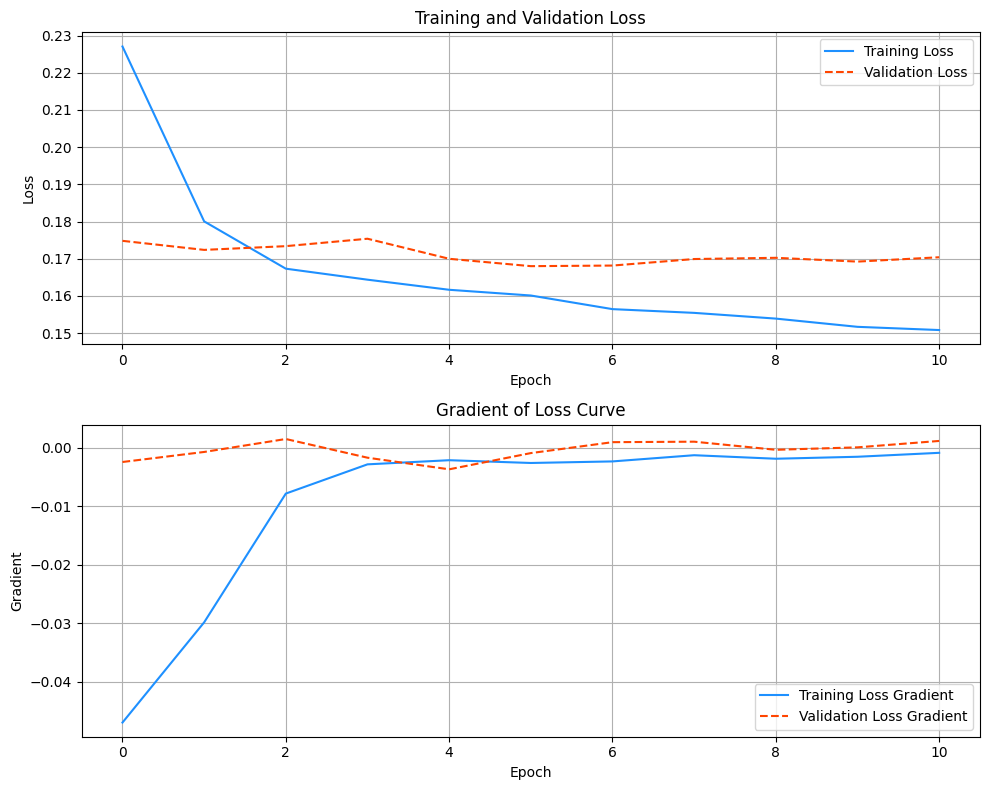


--- Final Model Evaluation ---
Test R² Score: 0.8829
Test MSE: 0.100878
Test MAE: 0.170669
Rank 1 Trial:
  Number: 57
  Value (Loss): 0.19486720412604364
  Params: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 32}
Rank 2 Trial:
  Number: 10
  Value (Loss): 0.1951919549656119
  Params: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}

Study Summary:
Total Trials: 60
Pruned Trials: 0
Completed Trials: 60


In [ ]:
final_model_bayesian, r2_bayesian, mse_bayesian, mae_bayesian = train_final_model(study, model_parameters, train_dataloader=train_dataloader, val_dataloader=val_dataloader, test_dataloader=test_dataloader)
best_n_models_baesian = show_n_best_models(study, n=2)
print("\nStudy Summary:")
print(f"Total Trials: {len(study.trials)}")
print(f"Pruned Trials: {sum(t.state == optuna.trial.TrialState.PRUNED for t in study.trials)}")
print(f"Completed Trials: {sum(t.state == optuna.trial.TrialState.COMPLETE for t in study.trials)}")

In [ ]:
best_n_models_baesian = show_n_best_models(study, n=5)

Rank 1 Trial:
  Number: 57
  Value (Loss): 0.19486720412604364
  Params: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 32}
Rank 2 Trial:
  Number: 10
  Value (Loss): 0.1951919549656119
  Params: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}
Rank 3 Trial:
  Number: 11
  Value (Loss): 0.1951919549656119
  Params: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}
Rank 4 Trial:
  Number: 12
  Value (Loss): 0.1951919549656119
  Params: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}
Rank 5 Trial:
  Number: 16
  Value (Loss): 0.1951919549656119
  Params: {'d_model_per_head': 32, 'nhead': 1, 'num_layers': 1, 'dim_feedforward': 128}


In [ ]:
##### Make a Prediction to the whole Dataset #####

y_pred, y_test, eval_loss, scores = predictor_multi_feature(
    model=final_model_bayesian, 
    test_dataloader=test_dataloader,
    y_scaler=y_numpy_scalers[0],
    criterion=nn.L1Loss(), 
    )

print(f'Evaluation Loss: {eval_loss}')

plotly_visualization_line(x=datetime, y=[y_test[:, 0], y_pred[:, 0]], name=['Actual', 'Predicted'])

Evaluation Loss: 0.2090120147518365
